In [76]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
"""
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
"""

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

import plotly.express as px
import plotly.graph_objects as go

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [77]:
"""
train = pd.read_csv("../input/store-sales-time-series-forecasting/train.csv",index_col = "date",parse_dates = True)
test = pd.read_csv("../input/store-sales-time-series-forecasting/test.csv")
holidays = pd.read_csv("../input/store-sales-time-series-forecasting/holidays_events.csv")
transactions = pd.read_csv("../input/store-sales-time-series-forecasting/transactions.csv")
stores = pd.read_csv("../input/store-sales-time-series-forecasting/stores.csv")
oil = pd.read_csv("../input/store-sales-time-series-forecasting/oil.csv")

sample = pd.read_csv("../input/store-sales-time-series-forecasting/sample_submission.csv")
"""

'\ntrain = pd.read_csv("../input/store-sales-time-series-forecasting/train.csv",index_col = "date",parse_dates = True)\ntest = pd.read_csv("../input/store-sales-time-series-forecasting/test.csv")\nholidays = pd.read_csv("../input/store-sales-time-series-forecasting/holidays_events.csv")\ntransactions = pd.read_csv("../input/store-sales-time-series-forecasting/transactions.csv")\nstores = pd.read_csv("../input/store-sales-time-series-forecasting/stores.csv")\noil = pd.read_csv("../input/store-sales-time-series-forecasting/oil.csv")\n\nsample = pd.read_csv("../input/store-sales-time-series-forecasting/sample_submission.csv")\n'

In [78]:
path = "C:/Users/DELL/Dropbox/code/forcasting/data/"


train = pd.read_csv(path + "train.csv",index_col = "date",parse_dates = True)
test = pd.read_csv(path + "test.csv",index_col = "date",parse_dates = True)
holidays = pd.read_csv(path + "holidays_events.csv")
transactions = pd.read_csv(path + "transactions.csv")
stores = pd.read_csv(path + "stores.csv")
oil = pd.read_csv(path + "oil.csv")
sample = pd.read_csv(path + "sample_submission.csv")

In [79]:
train

,id,store_nbr,family,sales,onpromotion
date,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.000,0
2013-01-01,1,1,BABY CARE,0.000,0
2013-01-01,2,1,BEAUTY,0.000,0
2013-01-01,3,1,BEVERAGES,0.000,0
2013-01-01,4,1,BOOKS,0.000,0
...,...,...,...,...,...
2017-08-15,3000883,9,POULTRY,438.133,0
2017-08-15,3000884,9,PREPARED FOODS,154.553,1
2017-08-15,3000885,9,PRODUCE,2419.729,148


## study of the series per day

In [80]:
df_train1 = pd.DataFrame(train.resample("D")["sales"].agg("sum"))
df_train1

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229
...,...
2017-08-11,826373.722022
2017-08-12,792630.535079
2017-08-13,865639.677471


### Trend

In [81]:
trend = df_train1.sales.rolling(
    window=365,       # 365-day window
    center=True,      # puts the average at the center of the window
    min_periods=183,  # choose about half the window size
).mean()  

trend = pd.Series(trend,name = "trend")
df_train1 = pd.concat([df_train1,trend],axis = 1)


In [82]:
df_train1

,sales,trend
date,,
2013-01-01,2511.618999,363542.683778
2013-01-02,496092.417944,363602.516572
2013-01-03,361461.231124,363404.774207
2013-01-04,354459.677093,363340.240475
2013-01-05,477350.121229,363961.493167
...,...,...
2017-08-11,826373.722022,856281.863770
2017-08-12,792630.535079,856841.404759
2017-08-13,865639.677471,856365.279093


In [83]:
fig1 = go.Figure()
fig1.add_trace(go.Scatter(x = df_train1.index, y = df_train1.sales,name = "sales"))
fig1.add_trace(go.Scatter(x = df_train1.index, y = df_train1.trend,name = 'trend'))
fig1

In [84]:
df_train1["sales_notrend"] = df_train1["sales"] - df_train1["trend"]

fig2 = go.Figure()
fig2.add_trace(go.Scatter(x = df_train1.index, y = df_train1.sales_notrend,name = "sales"))
fig2

### Saisonality

In [85]:
def create_season_feature(df):
    df["year"] = df["date"].dt.year
    df["month"] = df["date"].dt.month
    df["week"] = df["date"].dt.isocalendar().week
    df["day"] = df["date"].dt.day
    df["week_day"] = df["date"].dt.weekday
    
    df["year_month"] = df["year"].astype("str") + df['month'].astype(str).str.zfill(2)
    
    return df


df = df_train1.copy().reset_index()    
df = create_season_feature(df)


In [86]:
list_period = ['day','week_day','week','month']
for period in list_period:
    df_inter = pd.DataFrame(df.groupby(period)["sales"].agg("mean")).reset_index()
    fig = px.line(df_inter, x = period, y = "sales")
    fig.show()

In [87]:
df_train1.tail()

,sales,trend,sales_notrend
date,,,
2017-08-11,826373.722022,856281.863770,-29908.141748
2017-08-12,792630.535079,856841.404759,-64210.869681
2017-08-13,865639.677471,856365.279093,9274.398378
2017-08-14,760922.406081,855178.020284,-94255.614203
2017-08-15,762661.935939,855510.608197,-92848.672258


In [88]:
strat_train_date = "2015-05-01"
start_valid_date = "2017-05-17"
df_valid = df[df["date"] > start_valid_date]
df_train = df[(df["date"] <= start_valid_date) & (df["date"] >= strat_train_date)]

In [89]:
df_train['date'] = df.date.dt.to_period('D')
y2 = df_train.groupby("date")["sales"].agg("sum")

# the y must be in pandas.core.series type


fourier = CalendarFourier(freq='M', order=6)
dp2 = DeterministicProcess(
    index=y2.index,
    constant=True,
    order=1,
    # YOUR CODE HERE
    seasonal=True, 
    additional_terms=[fourier],
    drop=True)

X = dp2.in_sample()

model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y2)

y_pred = pd.DataFrame(model.predict(X), index=y2.index,columns = ["prediction"]).reset_index()
X_fore = dp2.out_of_sample(steps=90)
y_fore = pd.DataFrame(model.predict(X_fore), index=X_fore.index,columns = ["forecats"]).reset_index()



y_pred["date"] = y_pred["date"].astype(str)
y_pred["date"] = pd.to_datetime(y_pred["date"])

y_fore["date"] = y_fore["index"].astype(str)
y_fore["date"] = pd.to_datetime(y_fore["date"])

df_train["date"] = df_train["date"].astype(str)
df_train["date"] = pd.to_datetime(df_train["date"])


plot2 = go.Figure()
#plot2.add_trace(go.Scatter(x = y_pred.date, y = y_pred.prediction,name = "train_prediction"))
plot2.add_trace(go.Scatter(x = df_train.date, y = df_train.sales,name = "train_set"))
plot2.add_trace(go.Scatter(x = df_valid.date, y = df_valid.sales,name = "valid_set"))
plot2.add_trace(go.Scatter(x = y_fore.date, y = y_fore.forecats,name = "forecats"))


plot2


<ipython-input-89-b9b7a587cfae>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-89-b9b7a587cfae>:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-89-b9b7a587cfae>:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [90]:
mse = mean_squared_error(df_valid.sales, y_fore.forecats)
print("le rmse est",np.sqrt(mse))

le rmse est 75287.67884253901


## ARIMA model

<ipython-input-91-e54668f8fa9c>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



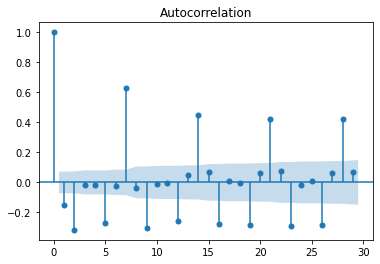

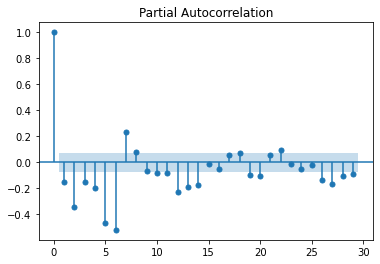

In [91]:
df_train['2difference']=df_train['sales'] - df_train['sales'].shift(1)

fig1=plot_acf(df_train['2difference'].dropna())
fig2=plot_pacf(df_train['2difference'].dropna())

In [92]:
model = SARIMAX(df_train['sales'],order=(1,1,1),seasonal_order=(1, 1, 0, 7))
results = model.fit()

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



In [93]:
train_size = int(len(df_train))
valid_size = train_size + 90 - 1
arima_forecast = results.predict(start = train_size, end = valid_size,type ="levels").rename("forecast")

arima_forecast = pd.DataFrame(arima_forecast)
arima_forecast["date"] = np.array(df_valid.date)

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



In [94]:

plot2 = go.Figure()
plot2.add_trace(go.Scatter(x = df_train.date, y = df_train.sales,name = "train_set"))
plot2.add_trace(go.Scatter(x = df_valid.date, y = df_valid.sales,name = "valid_set"))
plot2.add_trace(go.Scatter(x = arima_forecast.date, y = arima_forecast.forecast,name = "forecats"))
plot2


In [95]:
mse = mean_squared_error(arima_forecast.forecast, y_fore.forecats)
print("le rmse est",np.sqrt(mse))

le rmse est 75004.57855021214


## Machine learning model

In [96]:
X_train = df_train.loc[:, ["month","week","day","week_day"]]
X_train.index = df_train.date
y_train = df_train.sales_notrend

X_valid = df_valid.loc[:, ["month","week","day","week_day"]]
X_valid.index = df_valid.date
y_valid = df_valid.sales_notrend

X_train.week = X_train.week.astype("int64")
X_valid.week = X_valid.week.astype("int64")

In [97]:
import xgboost as xgb


reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
          eval_set=[(X_valid, y_valid)],
          early_stopping_rounds=50,
          verbose=50) 

xgb_for = pd.DataFrame(reg.predict(X_valid),columns = ["sales"],index = X_valid.index)

[0]	validation_0-rmse:126974.68750
[50]	validation_0-rmse:62315.50000
[76]	validation_0-rmse:65250.78906


In [98]:

plot2 = go.Figure()
plot2.add_trace(go.Scatter(x = df_train.date, y = df_train.sales_notrend,name = "train_set"))
plot2.add_trace(go.Scatter(x = df_valid.date, y = df_valid.sales_notrend,name = "valid_set"))
plot2.add_trace(go.Scatter(x = xgb_for.index, y = xgb_for.sales,name = "forecats"))
plot2

In [99]:
df_train['date'] = df_train.date.dt.to_period('D')
y2 = df_train.groupby("date")["sales"].agg("sum")

# the y must be in pandas.core.series type


dp = DeterministicProcess(
    index = y2.index,
    order = 1,
    drop = True)

X2 = dp.in_sample()

model = LinearRegression(fit_intercept=True)
model.fit(X2, y2)

y_pred2 = pd.DataFrame(model.predict(X2), index=y2.index,columns = ["prediction"]).reset_index()
X_fore2 = dp.out_of_sample(steps=90)
y_trend = pd.DataFrame(model.predict(X_fore2), index=X_fore2.index,columns = ["forecats"]).reset_index()



y_pred2["date"] = y_pred2["date"].astype(str)
y_pred2["date"] = pd.to_datetime(y_pred2["date"])

y_trend["date"] = y_trend["index"].astype(str)
y_trend["date"] = pd.to_datetime(y_trend["date"])

df_train["date"] = df_train["date"].astype(str)
df_train["date"] = pd.to_datetime(df_train["date"])


plot2 = go.Figure()
plot2.add_trace(go.Scatter(x = y_pred2.date, y = y_pred2.prediction,name = "train_prediction"))
plot2.add_trace(go.Scatter(x = df_train.date, y = df_train.sales,name = "train_set"))
plot2.add_trace(go.Scatter(x = df_valid.date, y = df_valid.sales,name = "valid_set"))
plot2.add_trace(go.Scatter(x = y_trend.date, y = y_trend.forecats,name = "forecats"))


plot2


<ipython-input-99-0868097e50b1>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-99-0868097e50b1>:29: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-99-0868097e50b1>:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [100]:
xgb_for.sales = xgb_for.sales + np.array(y_trend.forecats)

In [101]:

plot2 = go.Figure()
plot2.add_trace(go.Scatter(x = df_train.date, y = df_train.sales,name = "train_set"))
plot2.add_trace(go.Scatter(x = df_valid.date, y = df_valid.sales,name = "valid_set"))
plot2.add_trace(go.Scatter(x = xgb_for.index, y = xgb_for.sales,name = "forecats"))


plot2


In [102]:
mse = mean_squared_error(xgb_for.sales, y_fore.forecats)
print("le rmse est",np.sqrt(mse))

le rmse est 43888.72095320527


In [103]:
del df_train1,df_train

## All strore

### Pre-processing

In [104]:
##### merge with others dataset ####

train =  train.reset_index()
test = test.reset_index()

holidays["date"] = pd.to_datetime(holidays["date"])
oil["date"] = pd.to_datetime(oil["date"])
transactions["date"] = pd.to_datetime(transactions["date"])


print(train.shape)
print(test.shape)
# stores
train = train.merge(stores,how = "left", on = "store_nbr")
test = test.merge(stores,how = "left", on = "store_nbr")
# transaction
train = train.merge(transactions,how = "left", on = ["date","store_nbr"])
test = test.merge(transactions,how = "left", on = ["date","store_nbr"])
# oil
train = train.merge(oil,how = "left", on = "date")
test = test.merge(oil,how = "left", on = "date")

# holidays has duplicates
national_holiday = holidays[(holidays["locale"] == "National") & (holidays["type"] == "Holiday")]
local_holiday = holidays[(holidays["locale"] == "Local") & (holidays["type"] == "Holiday")]

national_holiday = national_holiday.drop_duplicates("date")
local_holiday = local_holiday. drop_duplicates(["date","locale_name"])
local_holiday = local_holiday.rename(columns = {"locale_name":"state"})


train = train.merge(national_holiday,how = "left", on = "date")
train = train.merge(local_holiday,how = "left", on = ["date","state"])

test = test.merge(national_holiday,how = "left", on = "date")
test = test.merge(local_holiday,how = "left", on = ["date","state"])

print(train.shape)
print(test.shape)

(3000888, 6)
(28512, 5)
(3000888, 21)
(28512, 20)


In [105]:
train

,date,id,store_nbr,family,sales,onpromotion,city,state,type_x,cluster,...,dcoilwtico,type_y,locale_x,locale_name,description_x,transferred_x,type,locale_y,description_y,transferred_y
0,2013-01-01,0,1,AUTOMOTIVE,0.000,0,Quito,Pichincha,D,13,...,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN,NaN,NaN,NaN
1,2013-01-01,1,1,BABY CARE,0.000,0,Quito,Pichincha,D,13,...,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN,NaN,NaN,NaN
2,2013-01-01,2,1,BEAUTY,0.000,0,Quito,Pichincha,D,13,...,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN,NaN,NaN,NaN
3,2013-01-01,3,1,BEVERAGES,0.000,0,Quito,Pichincha,D,13,...,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN,NaN,NaN,NaN
4,2013-01-01,4,1,BOOKS,0.000,0,Quito,Pichincha,D,13,...,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3000883,2017-08-15,3000883,9,POULTRY,438.133,0,Quito,Pichincha,B,6,...,47.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3000884,2017-08-15,3000884,9,PREPARED FOODS,154.553,1,Quito,Pichincha,B,6,...,47.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3000885,2017-08-15,3000885,9,PRODUCE,2419.729,148,Quito,Pichincha,B,6,...,47.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3000886,2017-08-15,3000886,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Quito,Pichincha,B,6,...,47.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [106]:
train["IsHolidays"] = 1*((train["type"] == "Holiday") | ((train["type_y"] == "Holiday")))
test["IsHolidays"] = 1*((test["type"] == "Holiday") | ((test["type_y"] == "Holiday")))

In [107]:
train.loc[:,["type","type_y","IsHolidays"]]

,type,type_y,IsHolidays
0,NaN,Holiday,1
1,NaN,Holiday,1
2,NaN,Holiday,1
3,NaN,Holiday,1
4,NaN,Holiday,1
...,...,...,...
3000883,NaN,NaN,0
3000884,NaN,NaN,0
3000885,NaN,NaN,0
3000886,NaN,NaN,0


In [108]:
train = create_season_feature(train)
test = create_season_feature(test)

### Visualisation

In [109]:
per_family = pd.DataFrame(train.groupby(["date","family"])["sales"].agg('sum')).reset_index()
per_store = pd.DataFrame(train.groupby(["date","store_nbr"])["sales"].agg('sum')).reset_index()

In [110]:
fig_family = px.line(per_family,x = 'date',y = "sales",color = "family")
fig_family.show()

In [111]:
fig_store = px.line(per_store,x = 'date',y = "sales",color = "store_nbr")
fig_store.show()

In [112]:
store_month = pd.DataFrame(train.groupby(["year_month","store_nbr"])["sales"].agg("mean")).reset_index()
family_month = pd.DataFrame(train.groupby(["year_month","family"])["sales"].agg("mean")).reset_index()

In [113]:
store_mean_fig = px.line(store_month,x = "year_month", y = "sales", color = "store_nbr")
store_mean_fig.show()

**We can see that some stores opened after the start of the data**

In [114]:
fam_mean_fig = px.line(family_month,x = "year_month", y = "sales", color = "family")
fam_mean_fig.show()

**Families "produce" and others have some iregularities before juin 2016. Grocery, Frozen Foods and others have peaks in december every year.**


## Modeling

In [115]:
valid = train[train["date"] > start_valid_date]
train = train[(train["date"] <= start_valid_date) & (train["date"] >= strat_train_date)]

train = train.groupby(["date","store_nbr","family"]).sum()
valid = valid.groupby(["date","store_nbr","family"]).sum()
test = test.groupby(["date","store_nbr","family"]).sum()

In [116]:
train

id    sales  \
date       store_nbr family                                         
2015-05-01 1         AUTOMOTIVE                  1511136    2.000   
                     BABY CARE                   1511137    0.000   
                     BEAUTY                      1511138    2.000   
                     BEVERAGES                   1511139  363.000   
                     BOOKS                       1511140    0.000   
...                                                  ...      ...   
2017-05-17 54        POULTRY                     2840371   44.233   
                     PREPARED FOODS              2840372   81.000   
                     PRODUCE                     2840373  506.987   
                     SCHOOL AND OFFICE SUPPLIES  2840374    1.000   
                     SEAFOOD                     2840375    2.000   

                                                 onpromotion  cluster  \
date       store_nbr family                                             
2015-05-01 1         AUTOMOTIVE                            0       13   
                     BABY CARE                             0       13   
                     BEAUTY                                0       13   
                     BEVERAGES                             1       13   
                     BOOKS                                 0       13   
...                                                      ...      ...   
2017-05-17 54        POULTRY                               0        3   
                     PREPARED FOODS                        0        3   
                     PRODUCE                               4        3   
                     SCHOOL AND OFFICE SUPPLIES            1        3   
                     SEAFOOD                               0        3   

                                                 transactions  dcoilwtico  \
date       store_nbr family                                                 
2015-05-01 1         AUTOMOTIVE                         476.0       59.10   
                     BABY CARE                          476.0       59.10   
                     BEAUTY                             476.0       59.10   
                     BEVERAGES                          476.0       59.10   
                     BOOKS                              476.0       59.10   
...                                                       ...         ...   
2017-05-17 54        POULTRY                            706.0       49.04   
                     PREPARED FOODS                     706.0       49.04   
                     PRODUCE                            706.0       49.04   
                     SCHOOL AND OFFICE SUPPLIES         706.0       49.04   
                     SEAFOOD                            706.0       49.04   

                                                 IsHolidays  year  month  \
date       store_nbr family                                                
2015-05-01 1         AUTOMOTIVE                           1  2015      5   
                     BABY CARE                            1  2015      5   
                     BEAUTY                               1  2015      5   
                     BEVERAGES                            1  2015      5   
                     BOOKS                                1  2015      5   
...                                                     ...   ...    ...   
2017-05-17 54        POULTRY                              0  2017      5   
                     PREPARED FOODS                       0  2017      5   
                     PRODUCE                              0  2017      5   
                     SCHOOL AND OFFICE SUPPLIES           0  2017      5   
                     SEAFOOD                              0  2017      5   

                                                 week  day  week_day  
date       store_nbr family                                           
2015-05-01 1         AUTOMOTIVE                    18    1         4  
  

In [117]:
y_train = train.unstack(["store_nbr","family"]).sales
y_valid = valid.unstack(["store_nbr","family"]).sales

In [118]:
y_train

store_nbr          1                                                 \
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2015-05-01        2.0       0.0    2.0     363.0   0.0      115.441   
2015-05-02        0.0       0.0    1.0    1245.0   0.0      389.238   
2015-05-03        2.0       0.0    1.0     469.0   0.0      149.258   
2015-05-04        5.0       0.0    3.0    1077.0   0.0      476.522   
2015-05-05        9.0       0.0    2.0    1106.0   0.0      380.086   
...               ...       ...    ...       ...   ...          ...   
2017-05-13        2.0       0.0   10.0    2498.0   0.0      463.982   
2017-05-14        2.0       0.0    1.0     883.0   0.0      170.293   
2017-05-15        9.0       0.0    3.0    2280.0   0.0      340.480   
2017-05-16        3.0       0.0    2.0    2393.0   0.0      364.471   
2017-05-17        2.0       0.0    5.0    2374.0   1.0      468.181   

store_nbr                                        ...        54          \
family     CELEBRATION CLEANING  DAIRY     DELI  ... MAGAZINES   MEATS   
date                                             ...                     
2015-05-01         0.0    221.0  242.0   63.003  ...       1.0  99.781   
2015-05-02         0.0    661.0  755.0  140.106  ...       0.0  64.520   
2015-05-03         0.0    243.0  317.0   57.530  ...       0.0  89.170   
2015-05-04         0.0    741.0  708.0  189.622  ...       0.0  47.478   
2015-05-05         0.0    774.0  747.0  157.082  ...       1.0  65.262   
...                ...      ...    ...      ...  ...       ...     ...   
2017-05-13        15.0    721.0  939.0  183.368  ...       1.0  52.402   
2017-05-14         3.0    152.0  299.0   62.698  ...       0.0  55.710   
2017-05-15        13.0    662.0  710.0  127.835  ...       1.0  71.532   
2017-05-16        12.0    785.0  794.0  142.449  ...       2.0  38.801   
2017-05-17        29.0    841.0  828.0  144.168  ...       0.0  41.839   

store_nbr                                                                  \
family     PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS     POULTRY   
date                                                                        
2015-05-01         169.0          0.0                     0.0   70.846000   
2015-05-02         290.0          0.0                     0.0   79.323000   
2015-05-03         431.0          0.0                     0.0   63.901000   
2015-05-04         222.0          0.0                     0.0   36.954998   
2015-05-05         181.0          0.0                     0.0   51.395000   
...                  ...          ...                     ...         ...   
2017-05-13         230.0          0.0                     3.0   78.491000   
2017-05-14         270.0          0.0                     8.0  109.932000   
2017-05-15         278.0          0.0                     7.0   42.798000   
2017-05-16         215.0          0.0                     1.0   67.987000   
2017-05-17         115.0          0.0                     3.0   44.233000   

store_nbr                                                               
family     PREPARED FOODS   PRODUCE SCHOOL AND OFFICE SUPPLIES SEAFOOD  
date                                                                    
2015-05-01           66.0     0.000                        0.0     4.0  
2015-05-02           42.0     0.000                        0.0     4.0  
2015-05-03          119.0     0.000                        0.0     8.0  
2015-05-04           22.0     0.000                        0.0     7.0  
2015-05-05           66.0     0.000                        0.0     0.0  
...                   ...       ...                        ...     ...  
2017-05-13           98.0  1049.891                        1.0     4.0  
2017-05-14          139.0  1016.544                        4.0     9.0  
2017-05-15           96.0   535.884                        5.0     9.0  
2017-05-16   

In [125]:
dp = DeterministicProcess(
    index = y_train.index,
    order = 1,
    drop = True)

X_train = dp.in_sample()

model = LinearRegression(fit_intercept=True)
model.fit(X_train, y_train)

X_val = dp.out_of_sample(steps=90)

train_pred = pd.DataFrame(model.predict(X_train), index = X_train.index, columns = y_train.columns).clip(0.)
valid_pred = pd.DataFrame(model.predict(X_val), index = X_valid.index, columns = y_valid.columns).clip(0.)

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\tsa\deterministic.py:147: UserWarning:

Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Int64Indexes with a unit increment support extending. The index is set will contain the position relative to the data length.



In [ ]:
def show_rmse(y_true,y_pred):
    pass



In [128]:
train_pred = pd.DataFrame(train_pred.stack(['store_nbr', 'family']),columns = ['pred'])
train_pred

pred
date       store_nbr family                                 
2015-05-01 1         AUTOMOTIVE                     3.590814
                     BABY CARE                      0.000000
                     BEAUTY                         2.246003
                     BEVERAGES                   1805.610183
                     BOOKS                          0.000000
...                                                      ...
2017-05-17 54        POULTRY                       61.735725
                     PREPARED FOODS                70.270627
                     PRODUCE                      731.910216
                     SCHOOL AND OFFICE SUPPLIES     3.591234
                     SEAFOOD                        1.805345

[1329372 rows x 1 columns]

In [ ]:
from sklearn.metrics import mean_squared_log_error as msle

In [129]:
y_train = pd.DataFrame(y_train.stack(['store_nbr', 'family']),columns = ['sales'])

In [130]:
result = pd.concat([y_train,train_pred],axis = 1)

In [131]:
result

sales         pred
date       store_nbr family                                          
2015-05-01 1         AUTOMOTIVE                    2.000     3.590814
                     BABY CARE                     0.000     0.000000
                     BEAUTY                        2.000     2.246003
                     BEVERAGES                   363.000  1805.610183
                     BOOKS                         0.000     0.000000
...                                                  ...          ...
2017-05-17 54        POULTRY                      44.233    61.735725
                     PREPARED FOODS               81.000    70.270627
                     PRODUCE                     506.987   731.910216
                     SCHOOL AND OFFICE SUPPLIES    1.000     3.591234
                     SEAFOOD                       2.000     1.805345

[1329372 rows x 2 columns]

In [134]:
print("RMSE per family")
print(result.groupby('family').apply(lambda r : np.sqrt(msle(r['sales'], r['pred']))))

print("RMSE per store")
print(result.groupby('store_nbr').apply(lambda r : np.sqrt(msle(r['sales'], r['pred']))))

RMSE per family
family
AUTOMOTIVE                    0.616069
BABY CARE                     0.300619
BEAUTY                        0.581856
BEVERAGES                     1.151547
BOOKS                         0.264611
BREAD/BAKERY                  0.871887
CELEBRATION                   0.828103
CLEANING                      0.996624
DAIRY                         0.925848
DELI                          0.777624
EGGS                          0.755645
FROZEN FOODS                  0.921009
GROCERY I                     1.203256
GROCERY II                    0.746633
HARDWARE                      0.562837
HOME AND KITCHEN I            0.786932
HOME AND KITCHEN II           0.747199
HOME APPLIANCES               0.388406
HOME CARE                     0.854545
LADIESWEAR                    0.753562
LAWN AND GARDEN               0.741088
LINGERIE                      0.756197
LIQUOR,WINE,BEER              1.529336
MAGAZINES                     0.655009
MEATS                         0.787642
PE